In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


class TrafficSignDetector:
    def __init__(self, images_dir, train_images_dir):
        """
        Initialize the TrafficSignDetector with directories for images.

        :param images_dir: Path to the root image directory
        :param train_images_dir: Path to the training images subdirectory
        """
        self.images_dir = images_dir
        self.train_images_dir = train_images_dir

        # Placeholder for image dimensions and processing steps
        self.height = None
        self.width = None
        self.gray_image = None
        self.histofram_eq_image = None
        self.blurred_image = None
        self.thresholded_image = None
        self.edges = None
        self.eroded_image = None
        self.filtered_components = None
        self.output_image = None
        self.circles = None
        self.detected_plates = []

    def process_image(self, image_name):
        """
        Process an image through the detection pipeline.
        
        :param image_name: Filename of the image to process
        """
        # 1. Load and convert to grayscale
        image_path = os.path.join(self.images_dir, self.train_images_dir, image_name)
        self.gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        self.height, self.width = self.gray_image.shape
        

        # 2. Gaussian blur
        kernel_size = (self.width // 50, self.height // 50)  # Relative kernel size
        kernel_size = (max(3, kernel_size[0] | 1), max(3, kernel_size[1] | 1))  # Ensure odd size
        self.blurred_image = cv2.GaussianBlur(self.gray_image, kernel_size, 0)

        

        # 3. Thresholding
        self.thresholded_image = cv2.adaptiveThreshold(
                self.blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 13, 2
                )

        
        # 4. Edge detection

        #make self.edges the negatice of the self.thresholded_image
        self.edges = cv2.bitwise_not(self.thresholded_image)
        
        #morphological operations to edge image
        kernel_size = (self.width // 100, self.height // 100)  # Relative kernel size
        kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, kernel_size)
        self.opened_edges = cv2.morphologyEx(self.edges, cv2.MORPH_CLOSE, kernel)
        
        # Connected components analysis
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(self.opened_edges, 8, cv2.CV_32S)
        self.connected_component_image = labels.copy()
        self.filtered_components = np.zeros(self.opened_edges.shape, dtype=np.uint8)
        for i in range(1, num_labels):
            if stats[i, cv2.CC_STAT_AREA] > (self.height * self.width) // 500:
                self.filtered_components[labels == i] = 255
                

        # 5. Morphological operations
        kernel_size = (self.width // 100, self.height // 100)  # Relative kernel size
        kernel_size = (max(3, kernel_size[0]), max(3, kernel_size[1]))  # Ensure minimum size
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
        dilated_image =   cv2.dilate(self.filtered_components, kernel, iterations=1)
        self.eroded_image = cv2.erode(dilated_image, kernel, iterations=1)


        # 6. Circle detection (Hough Transform)
        min_radius = min(self.height // 12, self.width // 12)  # Relative to image height
        max_radius = max(self.height // 2, self.width // 2)
        self.circles = cv2.HoughCircles(
            self.eroded_image,
            cv2.HOUGH_GRADIENT_ALT,
            dp=1,
            minDist=min(self.height // 20, self.width // 20),
            param1=50,
            param2=0.5,
            minRadius=min_radius,
            maxRadius=max_radius,
        )

        # 7. Remove overlapping circles
        self.remove_overlapping_circles()

        # 8. Draw detected circles and extract plates
        self.output_image = cv2.cvtColor(self.gray_image, cv2.COLOR_GRAY2BGR)
        if self.circles is not None:
            self.circles = np.uint16(np.around(self.circles))
            for circle in self.circles[0, :]:
                x, y, r = circle
                cv2.circle(self.output_image, (x, y), r, (0, 255, 0), 2)
                cropped_plate = self.gray_image[max(0, y - r) : min(self.height, y + r), max(0, x - r) : min(self.width, x + r)]
                self.detected_plates.append(cropped_plate)

    def remove_overlapping_circles(self, overlap_threshold=0.3):
        """
        Remove overlapping circles from the list based on a threshold.

        :param overlap_threshold: The minimum overlap ratio to consider two circles as overlapping
        """
        if self.circles is not None:
            valid_circles = []
            for i, circle1 in enumerate(self.circles[0, :]):
                x1, y1, r1 = circle1
                is_overlapping = False
                
                # If valid_circles is empty, we can add the first circle directly
                if len(valid_circles) == 0:
                    valid_circles.append(circle1)
                    continue
                
                for circle2 in valid_circles:
                    x2, y2, r2 = circle2
                    # Calculate distance between centers
                    distance = np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)
                    print(x1, y1, r1, x2, y2, r2, distance)
                    # Check if the circles overlap more than the threshold
                    print(distance, (r1 + r2) * (1 - overlap_threshold))
                    if distance < (r1 + r2) * (1 - overlap_threshold):
                        is_overlapping = True
                        break

                if not is_overlapping:
                    valid_circles.append(circle1)
            
            # Update self.circles with the filtered non-overlapping circles
            self.circles = np.array([valid_circles], dtype=np.uint16)


    def visualize_results(self):
        """
        Visualize intermediate results and detected plates.
        """
        titles = [
            "Original Image",
            "Gaussian Blur",
            "Thresholded Image",
            "Edges",
            "Opened Edges",
            "Connected Components",
            "Filtered Components",
            "Morphological Image",
            "Detected Circles",
        ]
        images = [
            self.gray_image,
            self.blurred_image,
            self.thresholded_image,
            self.edges,
            self.opened_edges,
            self.connected_component_image,
            self.filtered_components ,
            self.eroded_image,
            self.output_image,
        ]

        plt.figure(figsize=(20, 10))
        for i, (title, img) in enumerate(zip(titles, images), 1):
            if img is not None:
                plt.subplot(3, 4, i)
                plt.title(title)
                cmap = "gray" if len(img.shape) == 2 else None
                plt.imshow(img, cmap=cmap)
                #plt.axis("off")

        # Visualize detected plates
        for i, plate in enumerate(self.detected_plates, 1):
            plt.figure(figsize=(5, 5))
            plt.title(f"Detected Plate {i}")
            plt.imshow(plate, cmap="gray")
            #plt.axis("off")
            plt.show()

        plt.tight_layout()
        plt.show()


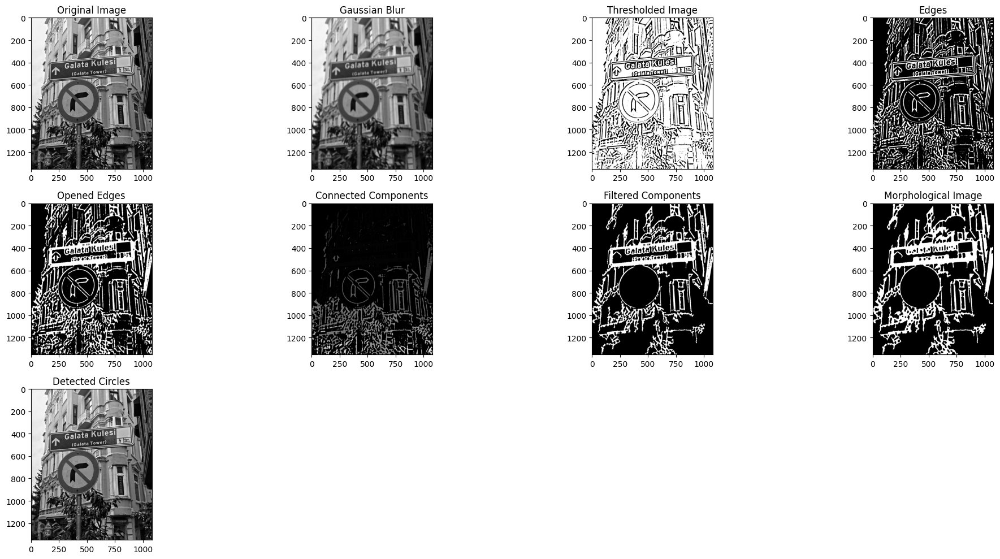

In [84]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_middle_2.png")
detector.visualize_results()

133.0 133.0 75.15034 125.0 103.0 86.27305 31.04835
31.04835 112.99637
107.0 175.0 28.154472 125.0 103.0 86.27305 74.215904
74.215904 80.099266


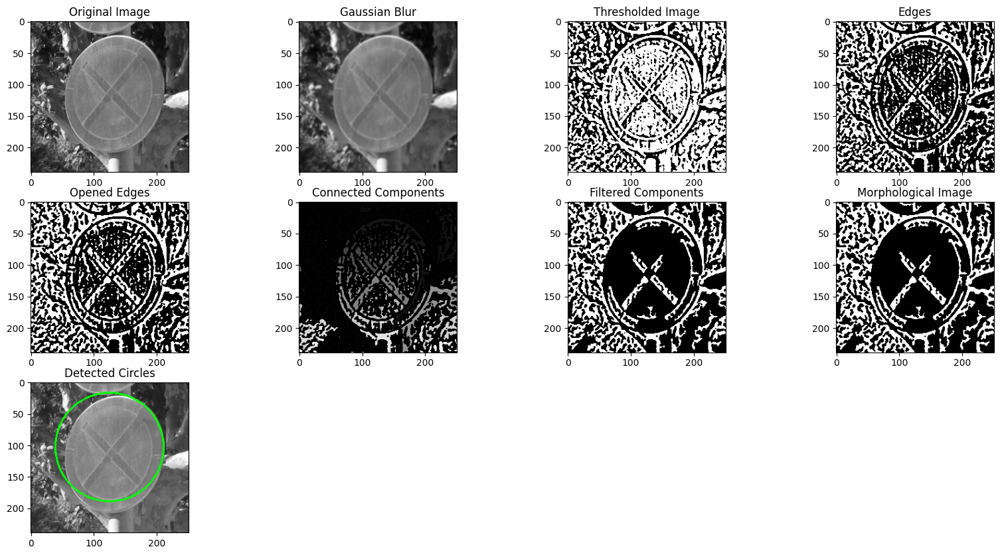

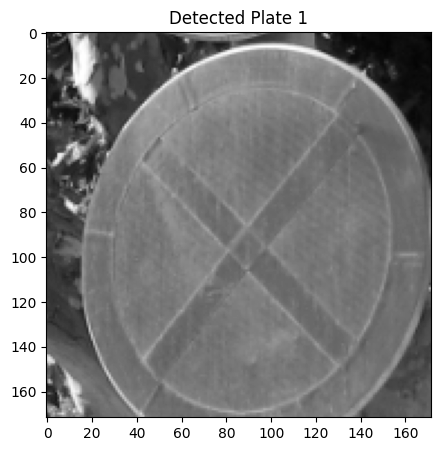

<Figure size 640x480 with 0 Axes>

In [85]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_easy_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


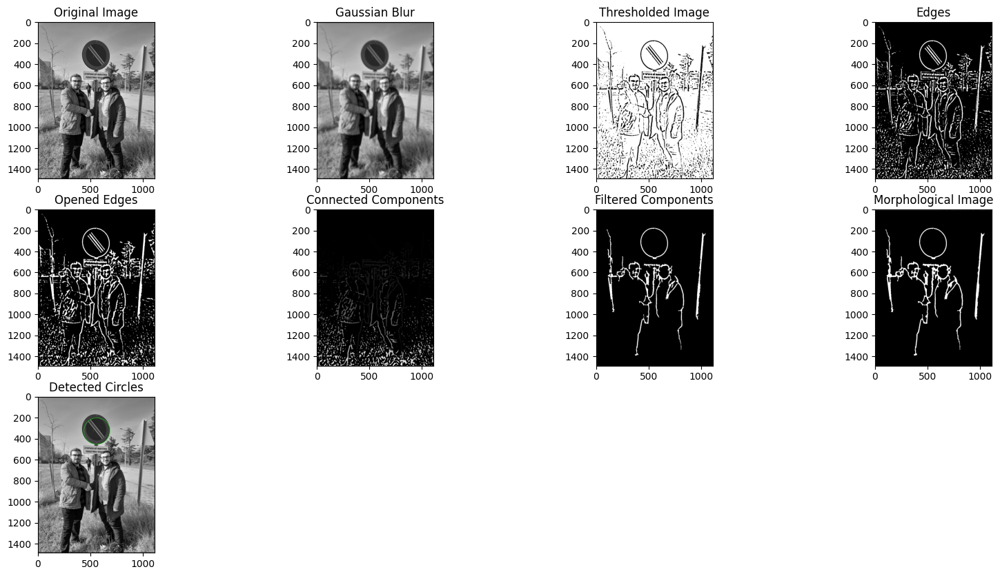

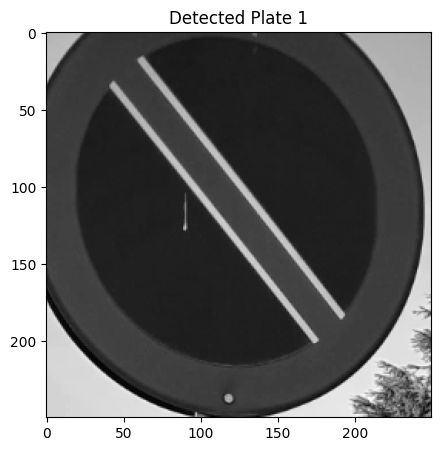

<Figure size 640x480 with 0 Axes>

In [86]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_hard_2.png")
detector.visualize_results()

79.0 78.0 37.870728 79.0 78.0 44.680943 0.0
0.0 57.786167
79.0 78.0 17.584068 79.0 78.0 44.680943 0.0
0.0 43.585506


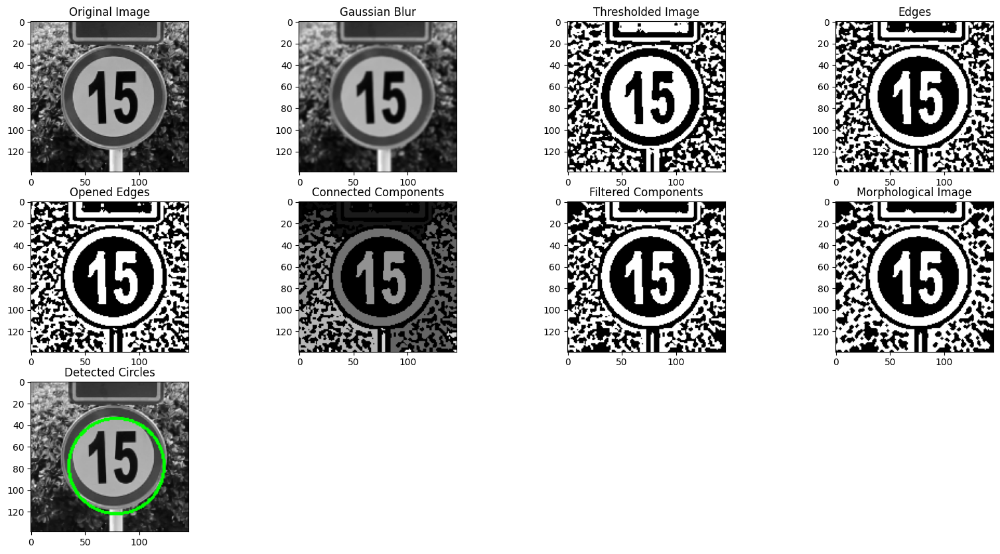

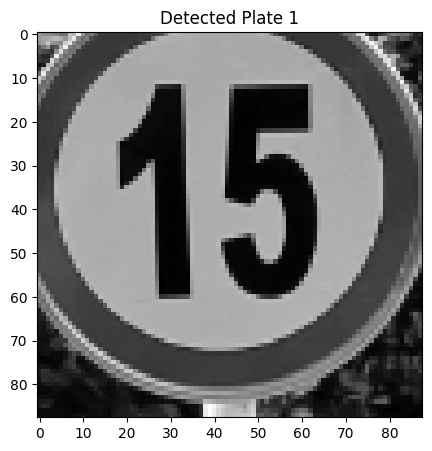

<Figure size 640x480 with 0 Axes>

In [87]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_easy_1.png")
detector.visualize_results()

133.0 133.0 75.15034 125.0 103.0 86.27305 31.04835
31.04835 112.99637
107.0 175.0 28.154472 125.0 103.0 86.27305 74.215904
74.215904 80.099266


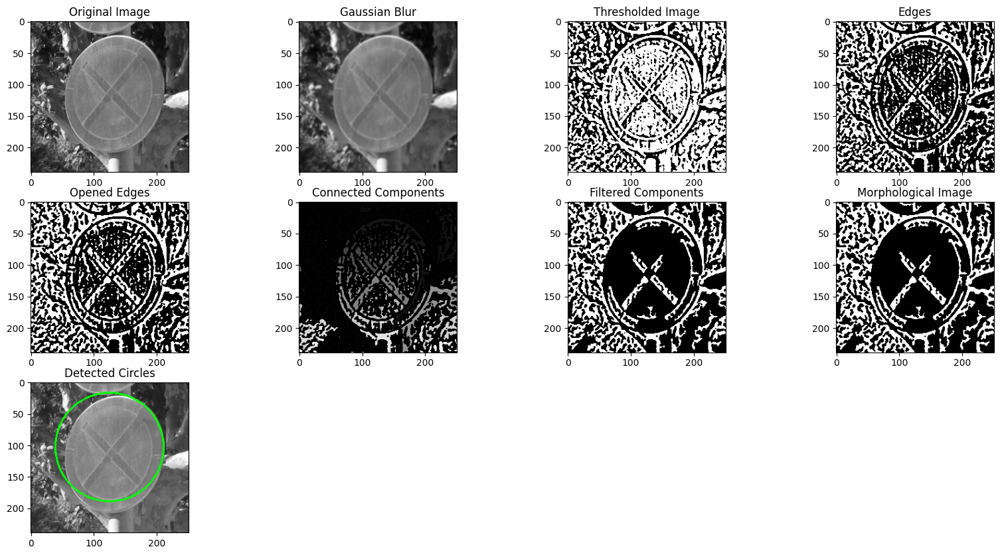

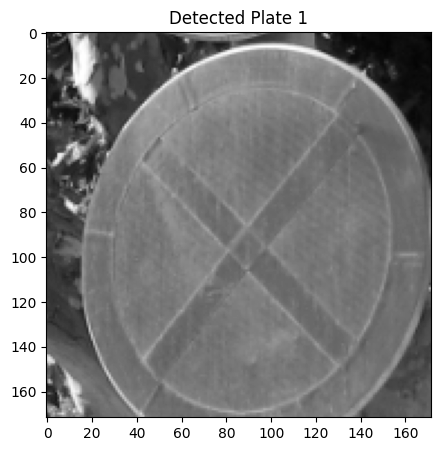

<Figure size 640x480 with 0 Axes>

In [88]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_easy_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


458.0 283.0 190.39685 458.0 283.0 210.49904 0.0
0.0 280.6271


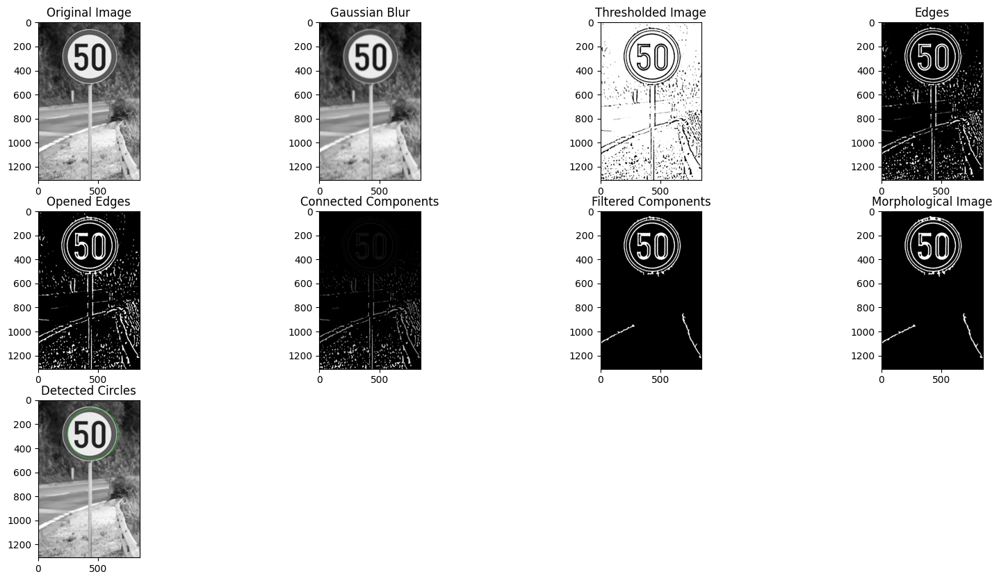

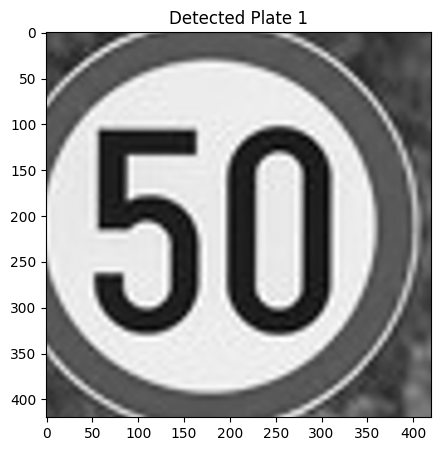

<Figure size 640x480 with 0 Axes>

In [89]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_middle_1.png")
detector.visualize_results()

169.0 152.0 72.91899 169.0 152.0 84.325424 0.0
0.0 110.07109
169.0 152.0 50.388912 169.0 152.0 84.325424 0.0
0.0 94.30003
169.0 152.0 37.424423 169.0 152.0 84.325424 0.0
0.0 85.22489


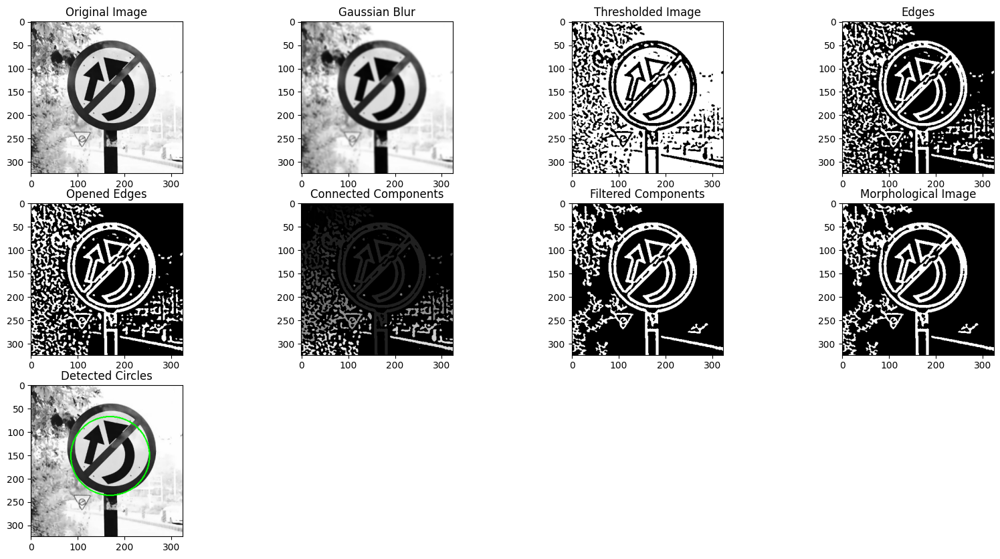

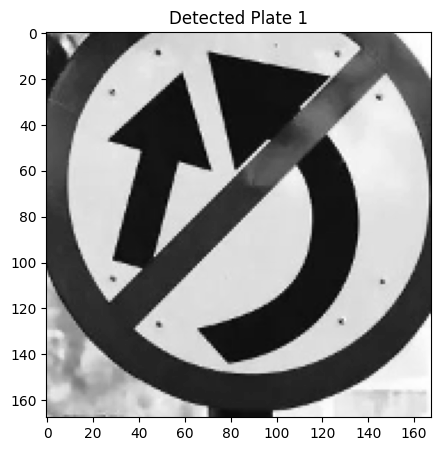

<Figure size 640x480 with 0 Axes>

In [90]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="train")
detector.process_image("train_middle_2.png")
detector.visualize_results()

# Test

186.0 176.0 122.873695 186.0 176.0 155.60345 0.0
0.0 194.93399
186.0 176.0 138.1419 186.0 176.0 155.60345 0.0
0.0 205.62175
207.0 243.0 91.88236 186.0 176.0 155.60345 70.21396
70.21396 173.24007


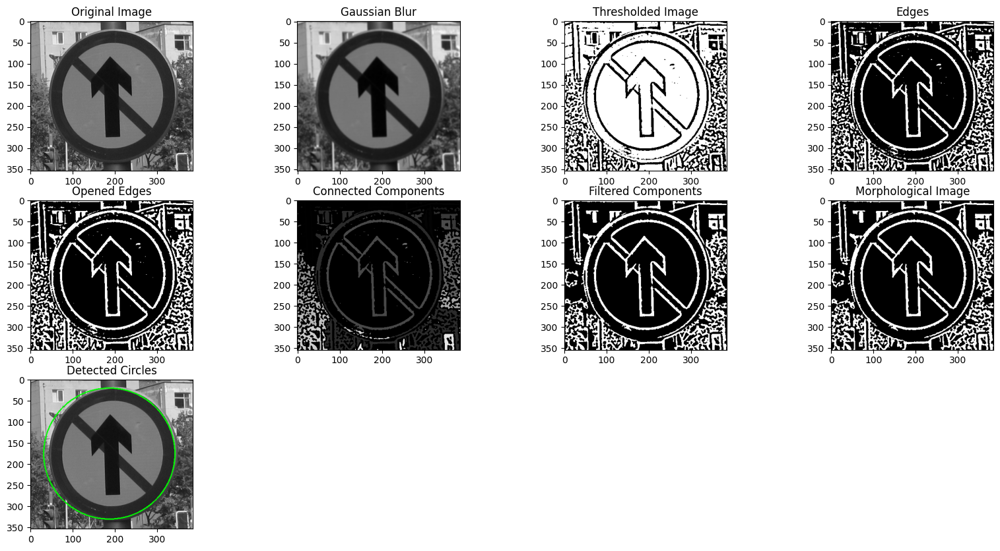

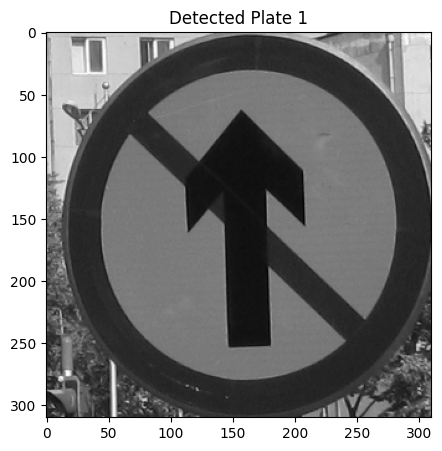

<Figure size 640x480 with 0 Axes>

In [91]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_easy_1.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


729.0 750.0 239.35973 736.0 291.0 226.13725 459.05338
459.05338 325.84787
250.0 329.0 209.35576 736.0 291.0 226.13725 487.48334
487.48334 304.8451
250.0 329.0 209.35576 729.0 750.0 239.35973 637.71625
637.71625 314.10083
729.0 750.0 179.32419 736.0 291.0 226.13725 459.05338
459.05338 283.823
729.0 750.0 179.32419 729.0 750.0 239.35973 0.0
0.0 293.07874
250.0 329.0 166.06267 736.0 291.0 226.13725 487.48334
487.48334 274.53995
250.0 329.0 166.06267 729.0 750.0 239.35973 637.71625
637.71625 283.7957
250.0 329.0 166.06267 250.0 329.0 209.35576 0.0
0.0 262.7929
250.0 745.0 189.93399 736.0 291.0 226.13725 665.0654
665.0654 291.24985
250.0 745.0 189.93399 729.0 750.0 239.35973 479.0261
479.0261 300.50558
250.0 745.0 189.93399 250.0 329.0 209.35576 416.0
416.0 279.5028
736.0 291.0 171.94336 736.0 291.0 226.13725 0.0
0.0 278.65643
250.0 745.0 212.63748 736.0 291.0 226.13725 665.0654
665.0654 307.1423
250.0 745.0 212.63748 729.0 750.0 239.35973 479.0261
479.0261 316.39804
250.0 745.0 212.63748 2

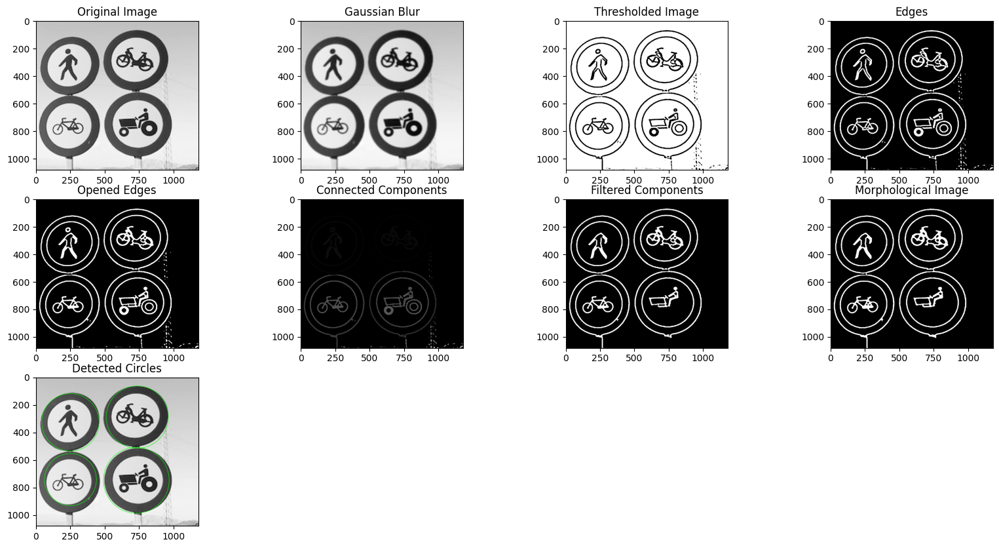

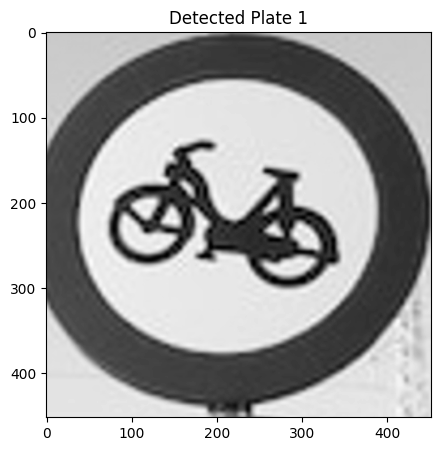

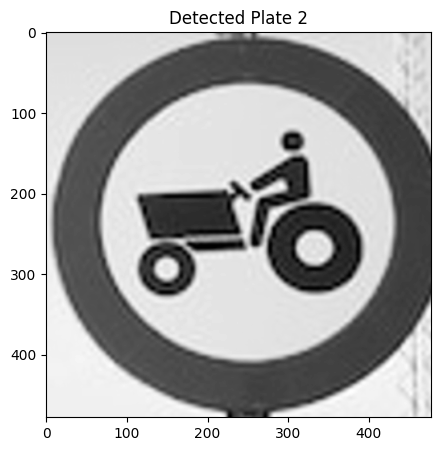

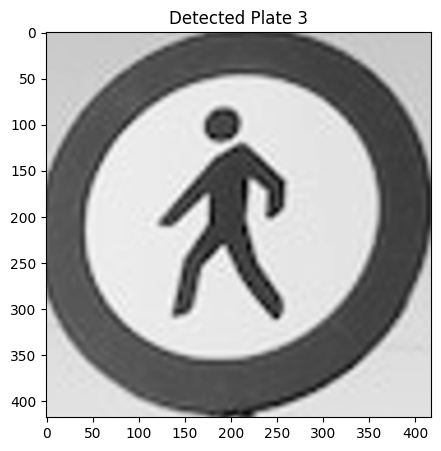

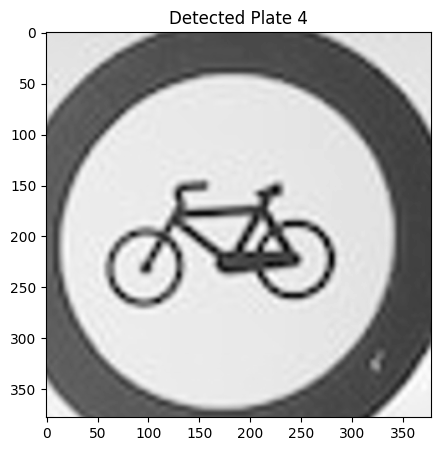

<Figure size 640x480 with 0 Axes>

In [92]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_easy_2.png")
detector.visualize_results()

888.0 263.0 132.59294 888.0 263.0 152.48671 0.0
0.0 199.55576
936.0 302.0 169.5386 888.0 263.0 152.48671 61.846584
61.846584 225.41772


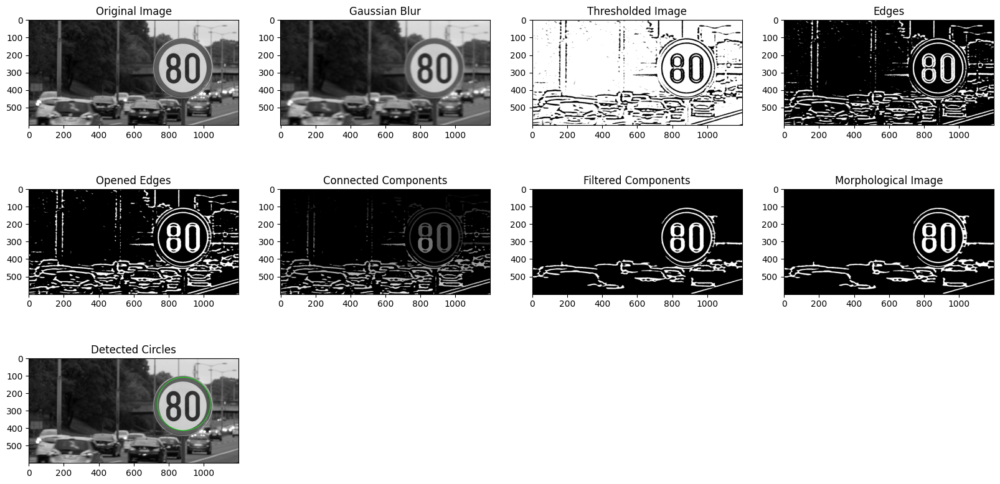

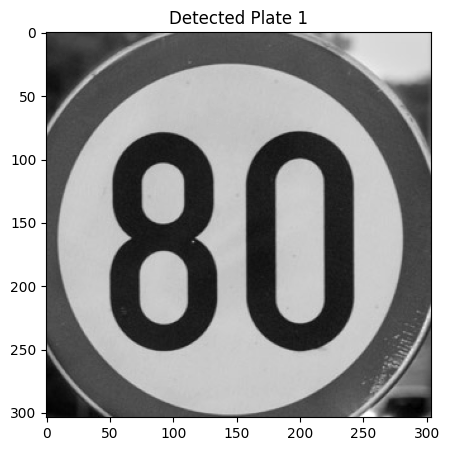

<Figure size 640x480 with 0 Axes>

In [93]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_middle_1.png")
detector.visualize_results()

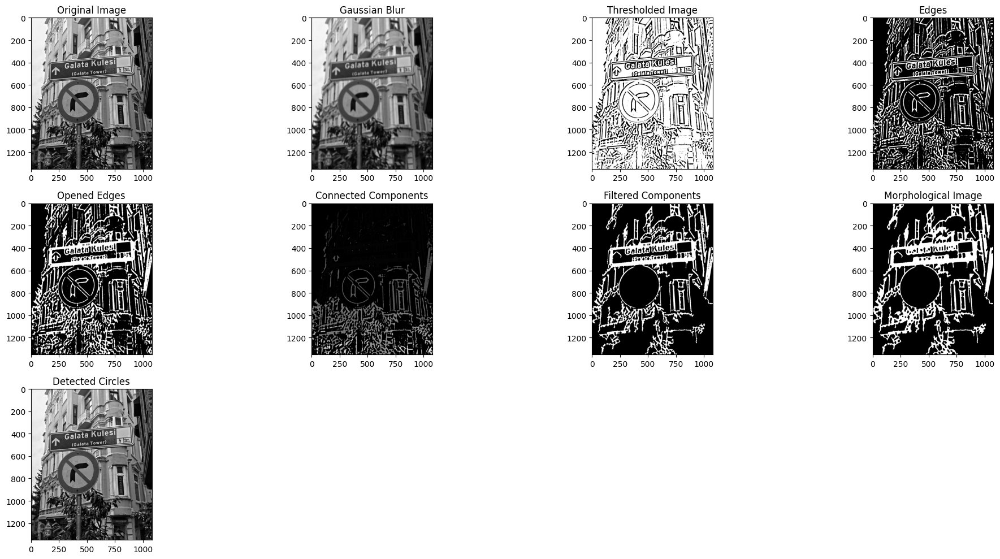

In [94]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_middle_2.png")
detector.visualize_results()

libpng warning: iCCP: profile 'ICC Profile': 'RGB ': RGB color space not permitted on grayscale PNG


399.0 170.0 152.05138 695.0 242.0 129.53702 304.63092
304.63092 197.11186
315.0 120.0 65.46156 695.0 242.0 129.53702 399.104
399.104 136.49901
315.0 120.0 65.46156 399.0 170.0 152.05138 97.7548
97.7548 152.25905
58.0 248.0 43.066013 695.0 242.0 129.53702 637.02826
637.02826 120.82212
58.0 248.0 43.066013 399.0 170.0 152.05138 349.8071
349.8071 136.58217
577.0 111.0 41.20767 695.0 242.0 129.53702 176.30939
176.30939 119.52128
577.0 111.0 41.20767 399.0 170.0 152.05138 187.52333
187.52333 135.28133
577.0 111.0 41.20767 58.0 248.0 43.066013 536.7774
536.7774 58.991577
577.0 111.0 51.11623 695.0 242.0 129.53702 176.30939
176.30939 126.45727
577.0 111.0 51.11623 399.0 170.0 152.05138 187.52333
187.52333 142.21732
577.0 111.0 51.11623 58.0 248.0 43.066013 536.7774
536.7774 65.92757
577.0 111.0 51.11623 577.0 111.0 41.20767 0.0
0.0 64.626724


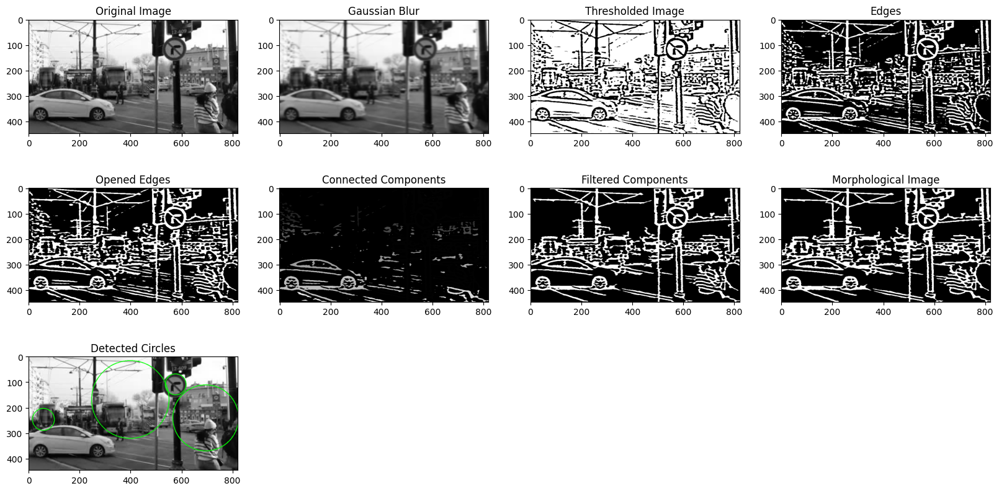

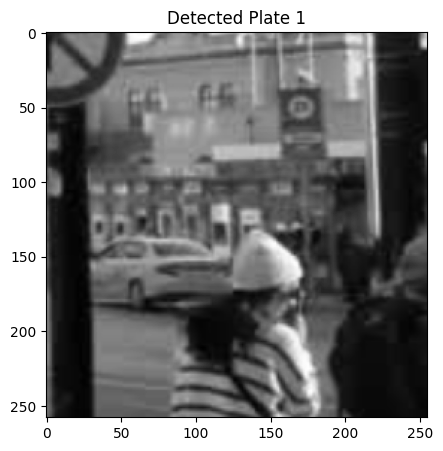

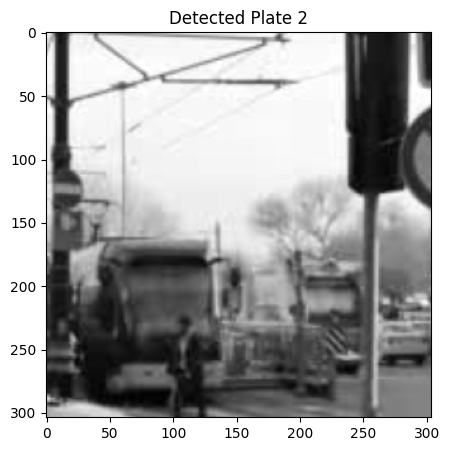

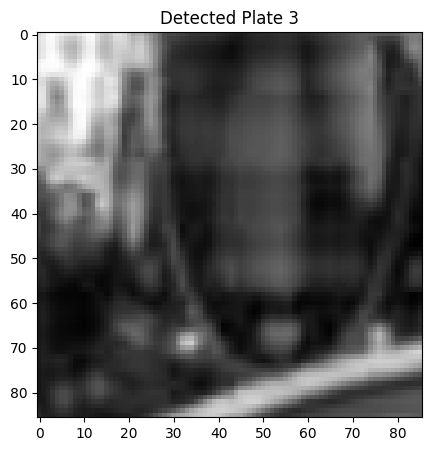

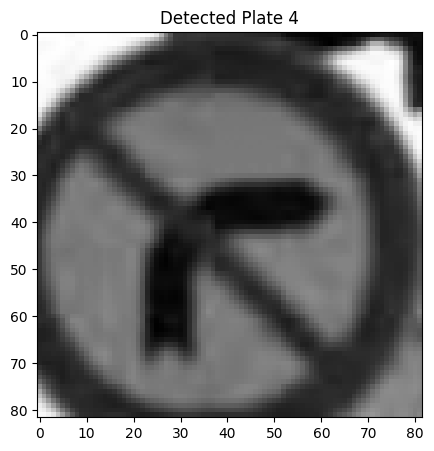

<Figure size 640x480 with 0 Axes>

In [95]:
detector = TrafficSignDetector(images_dir="images_gray", train_images_dir="test")
detector.process_image("test_hard_1.png")
detector.visualize_results()